<h1> <b>BUDT 758I: Financial Information Systems</b> <h1>

# **Getting Missing Pieces for Part B from previously ran Part A**

## **Getting Started**

In [2]:
# Connecting Colab to Google Drive
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/Smith School/SEM 3/FIS/Project

MessageError: ignored

In [4]:
# importing pandas library

import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import numpy as np
import scipy.stats as scs
import matplotlib.ticker as mtick

import statsmodels.api as sm
from statsmodels.regression.rolling import RollingOLS

import warnings
warnings.filterwarnings("ignore")

In [5]:
# initializing global utility varibales

pct_format_4d = '{:.4%}'
pct_format_2d = '{:.2%}'
aspect_ratio=(8,5)
annualization_factor = 260

#### **Creating all the utility functions required for the notebook**

In this section, we create utility functions that will use later in the notebook.

In [6]:
# Creating all utility functions here
from google import colab

# 1. Pretty Print
def printDF(df, pct_format = pct_format_4d, na_rep = 'NaN',  subset = pd.IndexSlice[:,:]):
  '''
  The function will need one required input parameter – the dataFrame itself. 
  Additional optional parameters can be the pct_format (2 or 4 decimal places), 
  na_rep and a dataFrame IndexSlice. 
  '''
  display(df.style.format(pct_format, na_rep=na_rep, subset = subset))

# 2. Summary statistics
def calc_summary_stats(dF, af=annualization_factor, percent_format_string=pct_format_2d):
  '''
  The function will print out the annual summary of a portfolio.

  Inputs: 
    Annualization factor, pct_format (2 or 4 decimal places)
  Returns:
    summary_stats containing 'Average Annual Return', 'Annual Risk', 'Sharpe Ratio', 'maxDD', 'Success Ratio'
  '''
  cumRtns = dF.cumsum()
  summary_stats = pd.DataFrame([af*dF.mean(),
                                np.sqrt(af)*dF.std(),
                                np.sqrt(af) * dF.mean() / dF.std(),
                                (cumRtns - np.maximum.accumulate(cumRtns)).min(axis=0),
                                (dF >= 0).sum() / dF.shape[0]
                                ],
                                index=['Average Annual Return', 'Annual Risk', 'Sharpe Ratio', 'maxDD', 'Success Ratio']
                              )
  printDF(summary_stats, pct_format=percent_format_string, subset=pd.IndexSlice[['Average Annual Return', 'Annual Risk', 'maxDD', 'Success Ratio'], :])
  return summary_stats

# 3. describe dataframe
def analyze(df):
  '''
  This function will describe a dataframe
  Input:
    A dataframe
  Returns:
    None
  '''
  print('\n1)','INFO')
  df.info() # print info
  print('\n2)', 'ANY NULL VALUES?')
  print(df.isnull().sum()) # check if any null values
  print('\n3)', 'SUMMARY STATISTICS')
  display(df.describe()) # print summary statistics
  display(df) # eyeball the full dF and then return it

# 4. Calculating Moving Average Crossover
def movingAverageCrossover(df, fastWindow, slowWindow, flatOrShort):
  # short is -1 and flat is 0
  '''
  This function will calculate the moving average crossover.

  Input:
  Target data frame, fast window, slow window and flatOrshort
  Return:
  Benchmark data frame containing 'Benchmark' and 'SMAReturns'
  '''
  col = df.columns[0]

  df.loc[:,'FastSMA'] = df[col].rolling(fastWindow).mean()
  df.loc[:,'SlowSMA'] = df[col].rolling(slowWindow).mean()
  df.dropna(inplace=True)
  
  # SMA strategy: if falling trend, go flat. If rising trend, go long
  df.loc[:,'Position'] = np.where(df['FastSMA'] > df['SlowSMA'], 1, flatOrShort)
  
  # calculate the benchmark
  df.loc[:,'Benchmark'] = np.log(df[col] / df[col].shift(1))
  df.loc[:,'SMAReturns'] = df['Position'].shift(1) * df['Benchmark']
  df.dropna(inplace=True)
  return df[['Benchmark', 'SMAReturns']]

# 5. Calculating Bollinger Bands
def bollingerBands(df, lookbackWindow, stdevBand):

  '''
  This function will calculate the bollinger band return.

  Inputs:
  Target dataframe, lookbackWindow (number of days), number of standard deviation of Bands

  Returns:
  dataframe containing the original return and the bollinger band return
  '''

  col = df.columns[0]
  # calculating rolling mean and standard deviation
  df.loc[:,'Mean'] = df[col].rolling(lookbackWindow).mean()
  df.loc[:,'Stdev'] = df[col].rolling(lookbackWindow).std()
  df.dropna(inplace=True)
  
  # creating upper and lower Bollinger band
  df.loc[:,'Upper'] = df['Mean'] + stdevBand * df['Stdev']
  df.loc[:,'Lower'] = df['Mean'] - stdevBand * df['Stdev']
  df.dropna(inplace=True)
  
  # initializng a new column called 'Position' using .loc as before
  date0 = df.index[0]
  if df.loc[date0,col] >= df.loc[date0, 'Upper']:
    df.loc[date0, 'Position'] = -1
  elif df.loc[date0,col] <= df.loc[date0,'Lower']:
    df.loc[date0, 'Position'] = 1
  else:
    df.loc[date0, 'Position'] = 0

  # then loop over the entire data set
  for i in range(1, df.shape[0]):
    today=df.index[i]
    yesterday=df.index[i-1]
    if df.loc[today,col] >= df.loc[today,'Upper']: # if SPY is above upper
      df.loc[today,'Position'] = -1 # then go short
    elif df.loc[today,col] <= df.loc[today,'Lower']: # if SPY is below lower
      df.loc[today,'Position'] = 1 # then go long
    elif df.loc[yesterday,'Position'] == -1 and df.loc[today,col] <= df.loc[today,'Mean']: # if prev day is short and we're now below the mean
      df.loc[today,'Position']= 0 # then flatten
    elif df.loc[yesterday,'Position'] == 1 and df.loc[today,col] >= df.loc[today, 'Mean']: # conversely...
      df.loc[today,'Position']= 0 # then also flatten
    else: # otherwise just hold yesterday's position
      df.loc[today,'Position']= df.loc[yesterday,'Position']
          
  # calculate the returns of the SPY price first...
  df.loc[:,'OriginalReturns'] = np.log(df[col] / df[col].shift(1))
  df.loc[:,'BBReturns'] = df['Position'].shift(1) * df['OriginalReturns']
  df.dropna(inplace=True)
  
  # returning the values
  return df[['OriginalReturns','BBReturns']]

# 6. Running Markov Chain Monte Carlo Simulation
def MCMC(logReturns):

  '''
  This function will execute the Markov Chain Monte Carlo Simulation
  Inputs:
  The log return of the instruments
  Returns:
  prets, pvols and weight array
  
  '''
  num_simulations = 5000
  prets = []
  pvols = []
  wts_array = []
  spxWeights = np.linspace(0, 1.0, num_simulations)
  rng = np.random.default_rng(seed=42)
  for p in spxWeights:
    wts = rng.random(8)
    wts /= np.sum(wts)
    wts_array.append(wts)
    prets.append(annualization_factor * np.dot(wts, logReturns.mean().T))
    pvols.append(np.sqrt(annualization_factor) * np.sqrt(np.dot(np.dot(wts, logReturns.cov()), wts.T)))

  prets = np.array(prets)
  pvols = np.array(pvols)
  return prets, pvols, wts_array

#### **Importing Data**

Read data from the csv file.

In [9]:
df = pd.read_csv('Prices.csv',index_col=0, parse_dates=True)
df.index.name = 'Date'
df.head()

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Date,,,,,,,,,,,
1999-12-31,0.917969,3.806250,36.820244,0.6567,798.154631,1.0062,396.794861,288.00,41.15625,5.380,146.8750
2000-01-03,0.999442,4.468750,35.498489,0.6585,793.868670,1.0243,384.615387,289.00,43.50000,5.405,145.4375
2000-01-04,0.915179,4.096875,33.421452,0.6550,796.761677,1.0296,369.230774,282.25,41.46875,5.325,139.7500
2000-01-05,0.928571,3.487500,33.940708,0.6579,793.118215,1.0321,368.589752,280.00,41.81250,5.145,140.0000
2000-01-06,0.848214,3.278125,33.043808,0.6533,795.091984,1.0328,373.517639,281.10,39.37500,5.120,137.7500


#### **Analyzing Dataframe**

In [10]:
#analyze the dataframe
analyze(df)


1) INFO
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4745 entries, 1999-12-31 to 2018-12-31
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    4745 non-null   float64
 1   AMZN    4745 non-null   float64
 2   ATT     4745 non-null   float64
 3   AUD     4745 non-null   float64
 4   BOND    4745 non-null   float64
 5   EUR     4745 non-null   float64
 6   GE      4745 non-null   float64
 7   GOLD    4745 non-null   float64
 8   INTC    4745 non-null   float64
 9   SILVER  4745 non-null   float64
 10  SPY     4745 non-null   float64
dtypes: float64(11)
memory usage: 444.8 KB

2) ANY NULL VALUES?
AAPL      0
AMZN      0
ATT       0
AUD       0
BOND      0
EUR       0
GE        0
GOLD      0
INTC      0
SILVER    0
SPY       0
dtype: int64

3) SUMMARY STATISTICS


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
count,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000,4745.000000
mean,12.906481,14.276243,24.837516,0.784642,1002.848125,1.214517,217.450605,910.952462,28.220152,14.879354,150.594514
std,13.980654,20.515985,5.171241,0.151062,76.259687,0.169549,78.177993,463.432487,10.666220,8.763344,50.893894
min,0.234286,0.298500,14.607251,0.479000,790.241628,0.827200,51.230770,255.550000,12.080000,4.060000,68.110001
25%,1.089286,1.973500,20.037764,0.707200,957.942747,1.112800,155.384613,418.350000,21.080000,6.805000,114.570000
50%,6.513214,4.441000,25.188822,0.766700,1003.602410,1.235500,215.692307,954.950000,25.230000,14.666000,133.779999
75%,22.629999,16.110001,28.429003,0.903000,1065.474821,1.336800,264.461548,1277.980000,32.799999,18.310500,186.309998
max,58.017502,101.975502,44.184292,1.102000,1128.970002,1.599100,461.538452,1897.460000,74.875000,48.443800,293.579987


,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Date,,,,,,,,,,,
1999-12-31,0.917969,3.806250,36.820244,0.6567,798.154631,1.0062,396.794861,288.00,41.156250,5.3800,146.875000
2000-01-03,0.999442,4.468750,35.498489,0.6585,793.868670,1.0243,384.615387,289.00,43.500000,5.4050,145.437500
2000-01-04,0.915179,4.096875,33.421452,0.6550,796.761677,1.0296,369.230774,282.25,41.468750,5.3250,139.750000
2000-01-05,0.928571,3.487500,33.940708,0.6579,793.118215,1.0321,368.589752,280.00,41.812500,5.1450,140.000000
2000-01-06,0.848214,3.278125,33.043808,0.6533,795.091984,1.0328,373.517639,281.10,39.375000,5.1200,137.750000
...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,36.707500,67.197998,20.664654,0.7049,998.805410,1.1406,53.230770,1269.22,43.590000,14.7750,234.339996
2018-12-26,39.292500,73.544998,21.208460,0.7066,996.301026,1.1353,56.846153,1267.14,46.189999,15.0355,246.179993
2018-12-27,39.037498,73.082001,21.261330,0.7033,998.396182,1.1430,55.923077,1275.71,46.360001,15.2275,248.070007


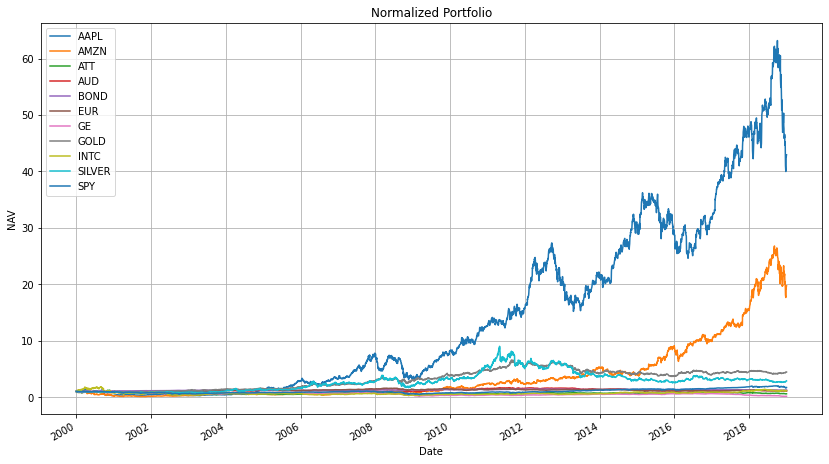

In [11]:
# plot normalized prices (or "NAVs")
ax = (df / df.iloc[0]).plot(figsize=(14,8), title='Normalized Portfolio', ylabel='NAV', grid=True)
# ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0,decimals=1))

#### **Calculating Log Returns for all the instruments**

In this section, we calcute the log returns for later use.

In [12]:
# next, we compute log returns of the original prices
allLogReturns = np.log(df / df.shift(1))

In [13]:
# calculate the log returns
cumReturns = allLogReturns.cumsum()
cumReturns.iloc[0,:] = allLogReturns.shape[1] * [0]
allLogReturns.dropna(inplace=True)
printDF(allLogReturns)

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Date,,,,,,,,,,,
2000-01-03 00:00:00,8.5034%,16.0464%,-3.6558%,0.2737%,-0.5384%,1.7829%,-3.1176%,0.3466%,5.5385%,0.4636%,-0.9835%
2000-01-04 00:00:00,-8.8077%,-8.6884%,-6.0292%,-0.5329%,0.3638%,0.5161%,-4.0822%,-2.3633%,-4.7821%,-1.4912%,-3.9891%
2000-01-05 00:00:00,1.4527%,-16.1039%,1.5417%,0.4418%,-0.4583%,0.2425%,-0.1738%,-0.8004%,0.8255%,-3.4387%,0.1787%
2000-01-06 00:00:00,-9.0514%,-6.1914%,-2.6781%,-0.7017%,0.2486%,0.0678%,1.3281%,0.3921%,-6.0064%,-0.4871%,-1.6202%
2000-01-07 00:00:00,4.6281%,5.9222%,0.8535%,0.2446%,0.2563%,-0.3200%,3.7991%,0.2310%,4.0441%,1.0685%,5.6452%
2000-01-10 00:00:00,-1.7744%,-0.5405%,1.4065%,0.1831%,-0.1691%,-0.3795%,-0.0413%,-0.0959%,4.4717%,-0.5814%,0.3425%
2000-01-11 00:00:00,-5.2506%,-3.5866%,-1.4065%,0.2588%,-0.4804%,0.7770%,0.1652%,0.6269%,4.4895%,0.2911%,-1.2038%
2000-01-12 00:00:00,-6.1847%,-4.8931%,-5.3831%,0.1367%,-0.1434%,-0.2616%,0.3295%,-0.3182%,1.7272%,-1.0716%,-0.9998%
2000-01-13 00:00:00,10.4069%,3.6684%,-2.4207%,1.3870%,0.4371%,-0.4959%,1.1447%,0.6707%,-0.2057%,0.0979%,1.3452%


#### **Finding Correlation**

In [14]:
corr_allInstrument = allLogReturns.corr()

In [15]:
# Finding correlation amongst the instruments and pretty printing
printDF(corr_allInstrument, pct_format=pct_format_2d)

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
AAPL,100.00%,32.93%,24.46%,17.80%,-15.93%,-0.05%,34.06%,-2.98%,46.96%,5.48%,49.33%
AMZN,32.93%,100.00%,18.20%,16.01%,-13.32%,0.03%,29.65%,-3.72%,38.33%,2.53%,46.56%
ATT,24.46%,18.20%,100.00%,23.57%,-12.99%,6.56%,38.30%,-2.19%,32.68%,4.88%,56.38%
AUD,17.80%,16.01%,23.57%,100.00%,-2.58%,54.75%,27.27%,33.39%,21.83%,40.93%,43.83%
BOND,-15.93%,-13.32%,-12.99%,-2.58%,100.00%,13.83%,-20.76%,16.32%,-19.22%,6.21%,-26.45%
EUR,-0.05%,0.03%,6.56%,54.75%,13.83%,100.00%,6.51%,38.63%,-0.37%,35.67%,11.20%
GE,34.06%,29.65%,38.30%,27.27%,-20.76%,6.51%,100.00%,-5.09%,42.49%,5.28%,69.63%
GOLD,-2.98%,-3.72%,-2.19%,33.39%,16.32%,38.63%,-5.09%,100.00%,-3.45%,76.59%,-1.44%
INTC,46.96%,38.33%,32.68%,21.83%,-19.22%,-0.37%,42.49%,-3.45%,100.00%,5.03%,64.15%
SILVER,5.48%,2.53%,4.88%,40.93%,6.21%,35.67%,5.28%,76.59%,5.03%,100.00%,14.84%


In [16]:
equities = ['AAPL','AMZN','GE','ATT','INTC','SPY']
bond = ['BOND']
commodities = ['SILVER','GOLD']
currency_pair = ['AUD','EUR']

In [17]:
printDF(corr_allInstrument.loc[equities, equities],pct_format=pct_format_2d)

,AAPL,AMZN,GE,ATT,INTC,SPY
AAPL,100.00%,32.93%,34.06%,24.46%,46.96%,49.33%
AMZN,32.93%,100.00%,29.65%,18.20%,38.33%,46.56%
GE,34.06%,29.65%,100.00%,38.30%,42.49%,69.63%
ATT,24.46%,18.20%,38.30%,100.00%,32.68%,56.38%
INTC,46.96%,38.33%,42.49%,32.68%,100.00%,64.15%
SPY,49.33%,46.56%,69.63%,56.38%,64.15%,100.00%


In [18]:
printDF(corr_allInstrument.loc[equities, bond],pct_format=pct_format_2d)

,BOND
AAPL,-15.93%
AMZN,-13.32%
GE,-20.76%
ATT,-12.99%
INTC,-19.22%
SPY,-26.45%


In [19]:
printDF(corr_allInstrument.loc[equities+bond, commodities],pct_format=pct_format_2d)

,SILVER,GOLD
AAPL,5.48%,-2.98%
AMZN,2.53%,-3.72%
GE,5.28%,-5.09%
ATT,4.88%,-2.19%
INTC,5.03%,-3.45%
SPY,14.84%,-1.44%
BOND,6.21%,16.32%


In [20]:
printDF(corr_allInstrument.loc[equities+bond+commodities, currency_pair],pct_format=pct_format_2d)

,AUD,EUR
AAPL,17.80%,-0.05%
AMZN,16.01%,0.03%
GE,27.27%,6.51%
ATT,23.57%,6.56%
INTC,21.83%,-0.37%
SPY,43.83%,11.20%
BOND,-2.58%,13.83%
SILVER,40.93%,35.67%
GOLD,33.39%,38.63%


#### **Summary statistics**

In [21]:
# calculate the summary of the log returns
summary_stats = calc_summary_stats(allLogReturns).iloc[[2]]

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Average Annual Return,20.61%,16.34%,-2.93%,0.39%,1.24%,0.72%,-10.52%,8.19%,0.72%,5.80%,2.91%
Annual Risk,43.31%,53.66%,26.62%,13.15%,3.75%,10.21%,31.43%,17.82%,38.00%,30.46%,19.62%
Sharpe Ratio,0.475834,0.304578,-0.110222,0.029530,0.331122,0.070168,-0.334616,0.459479,0.018933,0.190360,0.148482
maxDD,-170.38%,-270.61%,-110.69%,-48.78%,-14.21%,-43.14%,-219.82%,-59.07%,-182.43%,-126.48%,-83.18%
Success Ratio,52.23%,51.22%,51.64%,52.72%,52.47%,50.99%,50.08%,52.45%,51.69%,54.09%,53.94%


In [22]:
summary_stats

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Sharpe Ratio,0.475834,0.304578,-0.110222,0.02953,0.331122,0.070168,-0.334616,0.459479,0.018933,0.19036,0.148482


Looking at Co-relation matrix and Sharpe Ratios of all the instruments we create our portfolio as below.

## **Creating our own portfolio**

#### **Rationale for the portfolio** ####

As a starting point, we decided to look into the sharpe ratios and the average weights of all parameters. We predicted that Bond and Gold should have the highest weights as they are stable and popular assets in the global markets and are not related to our other portfolio assets (this may result in higher yields). We researched Bonds generally have a negative correlation and this is because of the following 3 factors: Real interest rate, Inflation rate, and Risk premium. This was confirmed by our calculated findings as well. 
For the purpose of diversification, we chose to look at the least correlated assets (like EUR-USD) in order to diversify our portfolio. Basically, we needed to ensure if one of our stocks goes down, our client can still make up through other investments which have the highest negative correlation in comparison. 
Now we noted that ATT and GE had similar correlation ratios with Gold and Bond. GE is more negatively correlated in comparison. In addition, it was the only major non-tech portfolio. This diversification benefits us in case of systematic risk scenarios that affect the Tech industries.

**Dropping AT&T, Silver, AUD-USD**

In [23]:
# set up the portfolio
portfolio = df[['AAPL', 'AMZN', 'EUR', 'BOND', 'GE', 'GOLD', 'INTC', 'SPY']]
portfolio

,AAPL,AMZN,EUR,BOND,GE,GOLD,INTC,SPY
Date,,,,,,,,
1999-12-31,0.917969,3.806250,1.0062,798.154631,396.794861,288.00,41.156250,146.875000
2000-01-03,0.999442,4.468750,1.0243,793.868670,384.615387,289.00,43.500000,145.437500
2000-01-04,0.915179,4.096875,1.0296,796.761677,369.230774,282.25,41.468750,139.750000
2000-01-05,0.928571,3.487500,1.0321,793.118215,368.589752,280.00,41.812500,140.000000
2000-01-06,0.848214,3.278125,1.0328,795.091984,373.517639,281.10,39.375000,137.750000
...,...,...,...,...,...,...,...,...
2018-12-24,36.707500,67.197998,1.1406,998.805410,53.230770,1269.22,43.590000,234.339996
2018-12-26,39.292500,73.544998,1.1353,996.301026,56.846153,1267.14,46.189999,246.179993
2018-12-27,39.037498,73.082001,1.1430,998.396182,55.923077,1275.71,46.360001,248.070007


## **Moving Average Crossover for instruments**

In this section, we calculate moving average crossover for each instruments for later use.

In [24]:
# defining the windows
fast=42
slow=260

In [25]:
# AAPL
flatOrShort = 0
df_temp = portfolio[['AAPL']].copy()
df_mac_aapl = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_aapl['SMAReturns'].mean() / df_mac_aapl['SMAReturns'].std()
print(sharpe)

0.8401776424816803


In [26]:
# AMZN
# going flat
flatOrShort = 0
df_temp = portfolio[['AMZN']].copy()
df_mac_amzn = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_amzn['SMAReturns'].mean() / df_mac_amzn['SMAReturns'].std()
print(sharpe)

0.6042472438877518


In [27]:
# EUR
# going short
flatOrShort = -1
df_temp = portfolio[['EUR']].copy()
df_mac_eur = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_eur['SMAReturns'].mean() / df_mac_eur['SMAReturns'].std()
print(sharpe)

0.26220971112840075


In [28]:
# BOND
# going flat
flatOrShort = 0
df_temp = portfolio[['BOND']].copy()
df_mac_bond = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_bond['SMAReturns'].mean() / df_mac_bond['SMAReturns'].std()
print(sharpe)

0.1170313066944414


In [29]:
# GE
# going short
flatOrShort = -1
df_temp = portfolio[['GE']].copy()
df_mac_ge = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_ge['SMAReturns'].mean() / df_mac_ge['SMAReturns'].std()
print(sharpe)

0.3389904068878988


In [30]:
# GOLD
# going flat
flatOrShort = 0
df_temp = portfolio[['GOLD']].copy()
df_mac_gold = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_gold['SMAReturns'].mean() / df_mac_gold['SMAReturns'].std()
print(sharpe)

0.553872259659042


In [31]:
# INTC
# going flat
flatOrShort = 0
df_temp = portfolio[['INTC']].copy()
df_mac_intc = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_intc['SMAReturns'].mean() / df_mac_intc['SMAReturns'].std()
print(sharpe)

-0.05082559633122282


In [32]:
# SPY
# going flat
flatOrShort = 0
df_temp = portfolio[['SPY']].copy()
df_mac_spy = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_spy['SMAReturns'].mean() / df_mac_spy['SMAReturns'].std()
print(sharpe)

0.546871745951271


## **Bollinger Bands**

In [33]:
# for Bollinger bands, need to calculate 20-day average and then +/- 2 stdevs
# configurable parameters for BB
window=20
stDevBand=2

In [34]:
# AAPL
df_bb_aapl = bollingerBands(portfolio[['AAPL']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_aapl[['BBReturns']].mean()/df_bb_aapl[['BBReturns']].std()
print(sharpe)

BBReturns   -0.434424
dtype: float64


In [35]:
# AMZN
df_bb_amzn = bollingerBands(portfolio[['AMZN']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_amzn[['BBReturns']].mean()/df_bb_amzn[['BBReturns']].std()
print(sharpe)

BBReturns    0.258309
dtype: float64


In [36]:
# EUR
df_bb_eur = bollingerBands(portfolio[['EUR']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_eur[['BBReturns']].mean()/df_bb_eur[['BBReturns']].std()
print(sharpe)

BBReturns   -0.248731
dtype: float64


In [37]:
# BOND
df_bb_bond = bollingerBands(portfolio[['BOND']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_bond[['BBReturns']].mean()/df_bb_bond[['BBReturns']].std()
print(sharpe)

BBReturns   -0.184488
dtype: float64


In [38]:
# GE
df_bb_ge = bollingerBands(portfolio[['GE']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_ge[['BBReturns']].mean()/df_bb_ge[['BBReturns']].std()
print(sharpe)

BBReturns   -0.249139
dtype: float64


In [39]:
# GOLD
df_bb_gold = bollingerBands(portfolio[['GOLD']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_gold[['BBReturns']].mean()/df_bb_gold[['BBReturns']].std()
print(sharpe)

BBReturns    0.081292
dtype: float64


In [40]:
# INTC
df_bb_intc = bollingerBands(portfolio[['INTC']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_intc[['BBReturns']].mean()/df_bb_intc[['BBReturns']].std()
print(sharpe)

BBReturns    0.313179
dtype: float64


In [41]:
# SPY
df_bb_spy = bollingerBands(portfolio[['SPY']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_spy[['BBReturns']].mean()/df_bb_spy[['BBReturns']].std()
print(sharpe)

BBReturns    0.324608
dtype: float64


####**Strategy:** 
We observed that no single strategy yields high results on investment and therefore we have used all the three strategies in a mixed and matched manner to obtain the best Sharpe ratio for better returns. 

We have used Bollinger Bands for INTC

Flat Moving Average Crossover for AAPL, AMZN, Gold, SPY  

Short Moving Average Crossover for EUR, GE for better Sharpe ratio  

Individual instrument for BOND without any strategy.


## **Getting log returns for the portfolio**

In [42]:
# set up the log return
logReturns = pd.concat((allLogReturns['BOND'],df_mac_aapl['SMAReturns'], df_mac_amzn['SMAReturns'], df_bb_intc['BBReturns'], df_mac_ge['SMAReturns'], df_mac_spy['SMAReturns'], df_mac_gold['SMAReturns'], df_mac_eur['SMAReturns']),axis = 1,join='inner')
logReturns.columns = ['BOND','AAPL','AMAZON','INTC','GE','SPY','GOLD','EUR']

In [43]:
analyze(logReturns)


1) INFO
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4485 entries, 2001-01-12 to 2018-12-31
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   BOND    4485 non-null   float64
 1   AAPL    4485 non-null   float64
 2   AMAZON  4485 non-null   float64
 3   INTC    4485 non-null   float64
 4   GE      4485 non-null   float64
 5   SPY     4485 non-null   float64
 6   GOLD    4485 non-null   float64
 7   EUR     4485 non-null   float64
dtypes: float64(8)
memory usage: 444.4 KB

2) ANY NULL VALUES?
BOND      0
AAPL      0
AMAZON    0
INTC      0
GE        0
SPY       0
GOLD      0
EUR       0
dtype: int64

3) SUMMARY STATISTICS


,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
count,4485.000000,4485.000000,4485.000000,4485.000000,4485.000000,4485.000000,4485.000000,4485.000000
mean,0.000032,0.000916,0.000772,0.000316,0.000402,0.000242,0.000309,0.000101
std,0.002322,0.017581,0.020608,0.015480,0.019138,0.007123,0.009009,0.006213
min,-0.012762,-0.162957,-0.181706,-0.132210,-0.179844,-0.067341,-0.072397,-0.034506
25%,-0.001331,-0.004940,-0.005196,-0.000447,-0.007788,-0.001343,-0.002360,-0.003381
50%,0.000127,0.000000,0.000000,0.000000,0.000272,0.000000,0.000000,0.000154
75%,0.001443,0.007548,0.007203,0.000933,0.008227,0.002858,0.003726,0.003726
max,0.013117,0.123608,0.238621,0.198924,0.136841,0.045451,0.063100,0.029299


,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
Date,,,,,,,,
2001-01-12,-0.004724,-0.0,0.000000,-0.000000,0.018971,-0.0,0.0,0.000631
2001-01-16,0.001185,-0.0,0.000000,-0.000000,-0.036270,0.0,-0.0,0.009081
2001-01-17,0.003317,-0.0,0.000000,-0.000000,0.014618,0.0,0.0,0.007346
2001-01-18,0.004006,0.0,0.000000,0.000000,-0.019881,0.0,0.0,-0.007665
2001-01-19,-0.003085,0.0,0.000000,0.000000,0.013210,-0.0,0.0,0.009376
...,...,...,...,...,...,...,...,...
2018-12-24,0.001688,-0.0,-0.024613,-0.028273,0.032697,-0.0,0.0,-0.002985
2018-12-26,-0.002511,0.0,0.000000,0.057936,-0.065712,0.0,-0.0,0.004658
2018-12-27,0.002101,-0.0,-0.000000,0.003674,0.016371,0.0,0.0,-0.006759


In [44]:
summ_stats = calc_summary_stats(logReturns)

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
Average Annual Return,0.84%,23.82%,20.08%,8.23%,10.46%,6.28%,8.05%,2.63%
Annual Risk,3.74%,28.35%,33.23%,24.96%,30.86%,11.49%,14.53%,10.02%
Sharpe Ratio,0.224273,0.840178,0.604247,0.329661,0.338990,0.546872,0.553872,0.262210
maxDD,-14.21%,-82.96%,-97.20%,-45.75%,-173.72%,-20.70%,-35.22%,-32.00%
Success Ratio,52.33%,65.08%,65.98%,74.58%,51.91%,68.90%,67.76%,51.46%


## **Mean-Variance optimization**

In [45]:
# runing Markov Chain Monte Carlo Simulation on our returns
prets, pvols, weights_arr = MCMC(logReturns)

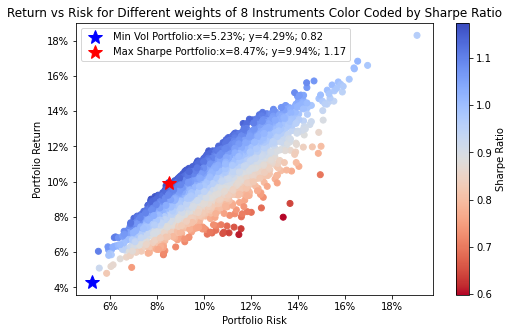

In [46]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = prets/pvols, marker='o', cmap='coolwarm_r')
##Include, in the above plot, a colorbar based on the Sharpe ratio, and use the reverse colormap
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk for Different weights of 8 Instruments Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.colorbar(label='Sharpe Ratio')
## Mark the minimum vol portfolio with a blue star
plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)]/pvols[np.argmin(pvols)])) 
## Mark the maximum Sharpe portfolio with a red star
plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], np.max(prets/pvols)))
plt.legend()
plt.show()

In [47]:
# finding index where max sharpe ratio was found
max_sharpe_idx = np.argmax(prets/pvols)

# finding index where min vol portfolio was obtained
min_vol_idx = np.argmin(pvols)

# creating a dataframe to show the weights of each security for min vol portfolio
min_vol_portfolio = pd.DataFrame(weights_arr[min_vol_idx],index=logReturns.columns,columns=['Weight'])
print(f'Minimum Volatility Portfolio')
printDF(min_vol_portfolio.transpose(), pct_format_2d)

weights = np.array(min_vol_portfolio.transpose())
min_vol = pd.DataFrame((weights * logReturns).sum(axis=1), columns=['Min Vol Port'])
summ_stats = calc_summary_stats(min_vol)

# creating a dataframe to show the weights of each security for max sharpe ratio
max_sharpe_allocation = pd.DataFrame(weights_arr[max_sharpe_idx],index=logReturns.columns,columns=['Weight'])
print(f'\n\nMaximum Sharpe Ratio Portfolio')
printDF(max_sharpe_allocation.transpose(), pct_format_2d)

weights = np.array(max_sharpe_allocation.transpose())
max_port = pd.DataFrame((weights * logReturns).sum(axis=1), columns=['Max Sharpe Port'])
summ_stats = calc_summary_stats(max_port)

Minimum Volatility Portfolio


,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
Weight,31.17%,2.23%,0.01%,5.47%,1.86%,10.68%,16.59%,31.99%


,Min Vol Port
Average Annual Return,4.29%
Annual Risk,5.23%
Sharpe Ratio,0.819681
maxDD,-10.43%
Success Ratio,53.96%




Maximum Sharpe Ratio Portfolio


,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
Weight,22.77%,20.14%,6.67%,6.88%,6.39%,3.39%,23.68%,10.09%


,Max Sharpe Port
Average Annual Return,9.94%
Annual Risk,8.47%
Sharpe Ratio,1.173954
maxDD,-20.91%
Success Ratio,54.69%


From the summary statistics of the chosen portfolio, we find that the stddev for returns of BOND, EUR, GOLD, SPY are very low compared to other instruments hence they have higher weight in the **Minimum Volatility Portfolio**.

Instruments like GOLD, BOND, AAPL had higher sharpe and hence the higher weightage in **Max Sharpe Portfolio**.

## **Comparison with Equal-weighted Portfolio**

In [48]:
# set up the equal-weighted portfolio
weights = np.array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])
wtd_port = pd.DataFrame((weights * logReturns).sum(axis=1), columns=['Equal-wt Port'])
wtd_port = logReturns.join(wtd_port, how='inner')
wtd_port

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Equal-wt Port
Date,,,,,,,,,
2001-01-12,-0.004724,-0.0,0.000000,-0.000000,0.018971,-0.0,0.0,0.000631,0.001860
2001-01-16,0.001185,-0.0,0.000000,-0.000000,-0.036270,0.0,-0.0,0.009081,-0.003250
2001-01-17,0.003317,-0.0,0.000000,-0.000000,0.014618,0.0,0.0,0.007346,0.003160
2001-01-18,0.004006,0.0,0.000000,0.000000,-0.019881,0.0,0.0,-0.007665,-0.002943
2001-01-19,-0.003085,0.0,0.000000,0.000000,0.013210,-0.0,0.0,0.009376,0.002438
...,...,...,...,...,...,...,...,...,...
2018-12-24,0.001688,-0.0,-0.024613,-0.028273,0.032697,-0.0,0.0,-0.002985,-0.002686
2018-12-26,-0.002511,0.0,0.000000,0.057936,-0.065712,0.0,-0.0,0.004658,-0.000704
2018-12-27,0.002101,-0.0,-0.000000,0.003674,0.016371,0.0,0.0,-0.006759,0.001923


In [49]:
# calculate the sharpe ratio of the equal-weighted portfolio and compare with the maximum
new_summary = calc_summary_stats(wtd_port)

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Equal-wt Port
Average Annual Return,0.84%,23.82%,20.08%,8.23%,10.46%,6.28%,8.05%,2.63%,10.05%
Annual Risk,3.74%,28.35%,33.23%,24.96%,30.86%,11.49%,14.53%,10.02%,9.20%
Sharpe Ratio,0.224273,0.840178,0.604247,0.329661,0.338990,0.546872,0.553872,0.262210,1.092588
maxDD,-14.21%,-82.96%,-97.20%,-45.75%,-173.72%,-20.70%,-35.22%,-32.00%,-15.40%
Success Ratio,52.33%,65.08%,65.98%,74.58%,51.91%,68.90%,67.76%,51.46%,54.25%


**The average Sharpe Ratio of the equal-weighted portfolio (1.09) is lower than that of the maximum Sharpe portfolio (1.17).**





## **Calculating Beta of the maximum Sharpe portfolio**

In [50]:
# set up the max portfolio whose beta we can calculate later
weights = np.array(max_sharpe_allocation.transpose())
max_port = pd.DataFrame((weights * logReturns).sum(axis=1), columns=['Max Sharpe Port'])

In [51]:
max_sharpe_return = logReturns.join(max_port, how='inner')
max_sharpe_return

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Max Sharpe Port
Date,,,,,,,,,
2001-01-12,-0.004724,-0.0,0.000000,-0.000000,0.018971,-0.0,0.0,0.000631,0.000200
2001-01-16,0.001185,-0.0,0.000000,-0.000000,-0.036270,0.0,-0.0,0.009081,-0.001132
2001-01-17,0.003317,-0.0,0.000000,-0.000000,0.014618,0.0,0.0,0.007346,0.002430
2001-01-18,0.004006,0.0,0.000000,0.000000,-0.019881,0.0,0.0,-0.007665,-0.001131
2001-01-19,-0.003085,0.0,0.000000,0.000000,0.013210,-0.0,0.0,0.009376,0.001087
...,...,...,...,...,...,...,...,...,...
2018-12-24,0.001688,-0.0,-0.024613,-0.028273,0.032697,-0.0,0.0,-0.002985,-0.001414
2018-12-26,-0.002511,0.0,0.000000,0.057936,-0.065712,0.0,-0.0,0.004658,-0.000317
2018-12-27,0.002101,-0.0,-0.000000,0.003674,0.016371,0.0,0.0,-0.006759,0.001095


In [52]:
from sklearn.linear_model import LinearRegression

X = max_sharpe_return.loc[:, max_sharpe_return.columns!='Max Sharpe Port']
X = sm.add_constant(X)

port = LinearRegression().fit(max_sharpe_return[['SPY']], max_sharpe_return['Max Sharpe Port'])
portfolio_beta = port.coef_
print(f'The beta for Max Sharpe Portfolio is {portfolio_beta[0]}')

The beta for Max Sharpe Portfolio is 0.36218423005928463


**The beta term for max sharpe portflio is 0.3622**

## **Revisiting all the instruments for improved strategy**

#### **MVO on Instrument based portfolio (No Strategy)**

In [53]:
prets, pvols, weights_arr = MCMC(allLogReturns[portfolio.columns])

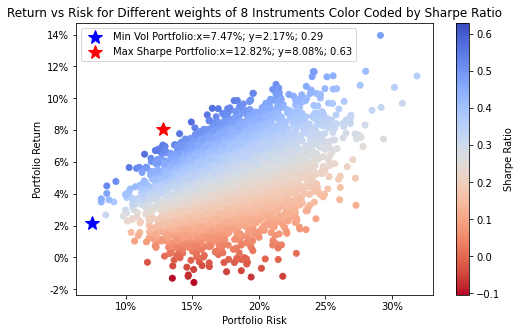

In [54]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = prets/pvols, marker='o', cmap='coolwarm_r')
##Include, in the above plot, a colorbar based on the Sharpe ratio, and use the reverse colormap
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk for Different weights of 8 Instruments Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.colorbar(label='Sharpe Ratio')
## Mark the minimum vol portfolio with a blue star
plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)]/pvols[np.argmin(pvols)])) 
## Mark the maximum Sharpe portfolio with a red star
plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], np.max(prets/pvols)))
plt.legend()
##Construct a legend for these two stars, and include in the legend the x-value (risk), y-value (return) and the Sharpe ratio

In [55]:
max_sharpe_allocation = pd.DataFrame(weights_arr[max_sharpe_idx],index=portfolio.columns,columns=['Weight'])
printDF(max_sharpe_allocation.transpose(), pct_format_2d)

print(f'Sharpe of the maximum-Sharpe portfolio of benchmarks is {np.max(prets/pvols):.4f}')

,AAPL,AMZN,EUR,BOND,GE,GOLD,INTC,SPY
Weight,22.77%,20.14%,6.67%,6.88%,6.39%,3.39%,23.68%,10.09%


Sharpe of the maximum-Sharpe portfolio of benchmarks is 0.6303


#### **MVO on Instrument based portfolio (MA Strategy for all selected instruments):**

###### In this section, we would consider the MA strategy for instruments where our chosen strategy for making an optimized portfolio was different earlier. *ie) MA would be considered for BOND and INTC instruments respectively*



In [56]:
#Concatenating SMA returns for individual instruments on which MAC was implemented
allMAlogReturns = pd.concat((df_mac_bond['SMAReturns'],df_mac_aapl['SMAReturns'], df_mac_amzn['SMAReturns'], df_mac_intc['SMAReturns'], df_mac_ge['SMAReturns'], df_mac_spy['SMAReturns'], df_mac_gold['SMAReturns'], df_mac_eur['SMAReturns']),axis = 1,join='inner')

#Renaming the columns with instrument name
allMAlogReturns.columns = ['BOND','AAPL','AMAZON','INTC','GE','SPY','GOLD','EUR']
allMAlogReturns

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
Date,,,,,,,,
2001-01-12,-0.004724,-0.0,0.000000,-0.0,0.018971,-0.0,0.0,0.000631
2001-01-16,0.001185,-0.0,0.000000,-0.0,-0.036270,0.0,-0.0,0.009081
2001-01-17,0.003317,-0.0,0.000000,-0.0,0.014618,0.0,0.0,0.007346
2001-01-18,0.004006,0.0,0.000000,0.0,-0.019881,0.0,0.0,-0.007665
2001-01-19,-0.003085,0.0,0.000000,0.0,0.013210,-0.0,0.0,0.009376
...,...,...,...,...,...,...,...,...
2018-12-24,0.000000,-0.0,-0.024613,-0.0,0.032697,-0.0,0.0,-0.002985
2018-12-26,-0.000000,0.0,0.000000,0.0,-0.065712,0.0,-0.0,0.004658
2018-12-27,0.000000,-0.0,-0.000000,0.0,0.016371,0.0,0.0,-0.006759


In [57]:
##Sanity check to see shape and verify for nulls
allMAlogReturns.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4485 entries, 2001-01-12 to 2018-12-31
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   BOND    4485 non-null   float64
 1   AAPL    4485 non-null   float64
 2   AMAZON  4485 non-null   float64
 3   INTC    4485 non-null   float64
 4   GE      4485 non-null   float64
 5   SPY     4485 non-null   float64
 6   GOLD    4485 non-null   float64
 7   EUR     4485 non-null   float64
dtypes: float64(8)
memory usage: 444.4 KB


In [58]:
## Running MVO

# runing Markov Chain Monte Carlo Simulation on our returns
prets, pvols, weights_arr = MCMC(allMAlogReturns)

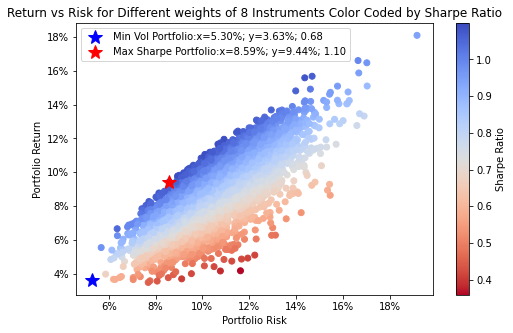

In [59]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = prets/pvols, marker='o', cmap='coolwarm_r')
##Include, in the above plot, a colorbar based on the Sharpe ratio, and use the reverse colormap
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk for Different weights of 8 Instruments Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.colorbar(label='Sharpe Ratio')
## Mark the minimum vol portfolio with a blue star
plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)]/pvols[np.argmin(pvols)])) 
## Mark the maximum Sharpe portfolio with a red star
plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], np.max(prets/pvols)))
plt.legend()
##Construct a legend for these two stars, and include in the legend the x-value (risk), y-value (return) and the Sharpe ratio

In [60]:
# finding index where max sharpe ratio was found
max_sharpe_idx_MA = np.argmax(prets/pvols)

# finding index where min vol portfolio was obtained
min_vol_idx_MA = np.argmin(pvols)

# creating a dataframe to show the weights of each security for max sharpe ratio
max_sharpe_allocation_MA = pd.DataFrame(weights_arr[max_sharpe_idx_MA],index=allMAlogReturns.columns,columns=['Weight'])
printDF(max_sharpe_allocation_MA.transpose(), pct_format_2d)

print(f'Sharpe of the maximum-Sharpe portfolio of MA Strategy on all instruments is {np.max(prets/pvols):.4f}')

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
Weight,14.72%,15.03%,9.64%,0.85%,8.58%,11.90%,22.25%,17.03%


Sharpe of the maximum-Sharpe portfolio of MA Strategy on all instruments is 1.0989


**MVO on Instrument based portfolio (BB Strategy for all selected instruments):**

###### In this section, we would consider the BB strategy for instruments where our chosen strategy for making an optimized portfolio was different earlier. *ie) BB for BOND, AAPL, AMZN, GE, SPY, GOLD, EUR*

In [61]:
#Concatenating BB returns for individual instruments on which BB was implemented
allBBlogReturns = pd.concat((df_bb_bond['BBReturns'],df_bb_aapl['BBReturns'], df_bb_amzn['BBReturns'], df_bb_intc['BBReturns'], df_bb_ge['BBReturns'], df_bb_spy['BBReturns'], df_bb_gold['BBReturns'], df_bb_eur['BBReturns']),axis = 1,join='inner')

#Renaming the columns with instrument name
allBBlogReturns.columns = ['BOND','AAPL','AMAZON','INTC','GE','SPY','GOLD','EUR']
allBBlogReturns

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
Date,,,,,,,,
2000-01-31,-0.000000,0.000000,0.000000,0.000000,0.000000,0.026777,0.000000,-0.004112
2000-02-01,0.000000,-0.000000,0.000000,0.000000,0.014815,0.009804,-0.000000,0.000412
2000-02-02,0.000000,-0.000000,0.000000,-0.000000,-0.014349,0.000887,0.000000,0.005545
2000-02-03,0.000000,0.000000,0.000000,0.000000,0.037965,0.014952,0.000000,0.013124
2000-02-04,0.002785,0.000000,0.069152,0.000000,0.016470,-0.000000,0.000000,-0.006286
...,...,...,...,...,...,...,...,...
2018-12-24,-0.001688,-0.026215,-0.024613,-0.028273,-0.000000,-0.026778,-0.009722,-0.002985
2018-12-26,0.002511,0.068053,0.090254,0.057936,0.000000,0.049290,0.001640,0.004658
2018-12-27,-0.002101,-0.006511,-0.006315,0.003674,-0.000000,0.007648,-0.006740,0.000000


In [62]:
##Sanity check to see shape and verify for nulls
allBBlogReturns.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4725 entries, 2000-01-31 to 2018-12-31
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   BOND    4725 non-null   float64
 1   AAPL    4725 non-null   float64
 2   AMAZON  4725 non-null   float64
 3   INTC    4725 non-null   float64
 4   GE      4725 non-null   float64
 5   SPY     4725 non-null   float64
 6   GOLD    4725 non-null   float64
 7   EUR     4725 non-null   float64
dtypes: float64(8)
memory usage: 461.3 KB


In [63]:
## Running MVO

# runing Markov Chain Monte Carlo Simulation on our returns
prets, pvols, weights_arr = MCMC(allBBlogReturns)

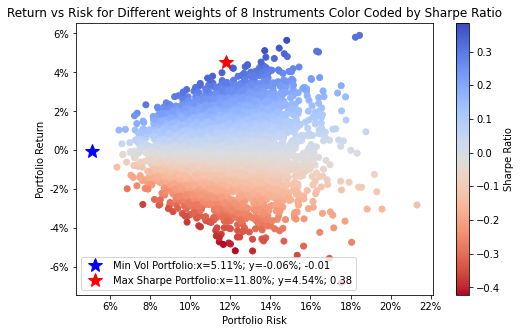

In [64]:
plt.figure(figsize=aspect_ratio)
ax = plt.subplot()
plt.scatter(pvols, prets, c = prets/pvols, marker='o', cmap='coolwarm_r')
##Include, in the above plot, a colorbar based on the Sharpe ratio, and use the reverse colormap
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))
plt.title('Return vs Risk for Different weights of 8 Instruments Color Coded by Sharpe Ratio')
plt.xlabel('Portfolio Risk')
plt.ylabel('Portfolio Return')
plt.colorbar(label='Sharpe Ratio')
## Mark the minimum vol portfolio with a blue star
plt.plot(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], 'b*', markersize=15.0, label='Min Vol Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmin(pvols)], prets[np.argmin(pvols)], prets[np.argmin(pvols)]/pvols[np.argmin(pvols)])) 
## Mark the maximum Sharpe portfolio with a red star
plt.plot(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], 'r*', markersize=15.0, label='Max Sharpe Portfolio:x={:.2%}; y={:.2%}; {:1.2f}'.format(pvols[np.argmax(prets/pvols)], prets[np.argmax(prets/pvols)], np.max(prets/pvols)))
plt.legend()
##Construct a legend for these two stars, and include in the legend the x-value (risk), y-value (return) and the Sharpe ratio

In [65]:
# finding index where max sharpe ratio was found
max_sharpe_idx_BB = np.argmax(prets/pvols)

# finding index where min vol portfolio was obtained
min_vol_idx_BB = np.argmin(pvols)

# creating a dataframe to show the weights of each security for max sharpe ratio
max_sharpe_allocation_BB = pd.DataFrame(weights_arr[max_sharpe_idx_BB],index=allBBlogReturns.columns,columns=['Weight'])
printDF(max_sharpe_allocation_BB.transpose(), pct_format_2d)

print(f'Sharpe of the maximum-Sharpe portfolio of Bolinger Bands Strategy on all instruments is {np.max(prets/pvols):.4f}')

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR
Weight,14.74%,0.74%,15.11%,23.55%,0.11%,22.05%,20.92%,2.77%


Sharpe of the maximum-Sharpe portfolio of Bolinger Bands Strategy on all instruments is 0.3847


No, none of the single strategy based portfolio outperforms the optimized portfolio.

## **Summary Statistics for the Entire Portfolio**

In [66]:
final_summary = calc_summary_stats(max_sharpe_return)

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Max Sharpe Port
Average Annual Return,0.84%,23.82%,20.08%,8.23%,10.46%,6.28%,8.05%,2.63%,9.94%
Annual Risk,3.74%,28.35%,33.23%,24.96%,30.86%,11.49%,14.53%,10.02%,8.47%
Sharpe Ratio,0.224273,0.840178,0.604247,0.329661,0.338990,0.546872,0.553872,0.262210,1.173954
maxDD,-14.21%,-82.96%,-97.20%,-45.75%,-173.72%,-20.70%,-35.22%,-32.00%,-20.91%
Success Ratio,52.33%,65.08%,65.98%,74.58%,51.91%,68.90%,67.76%,51.46%,54.69%


We found that this particular combination not only gave good returns but also is a safer diversified bet. We did not find optimal returns just by applying basic Instrument, Bollinger Bands, Moving Average Crossover(either short or flat) for all 8 investments and therefore chose to mix and match. So for the best result we have used a combination of Bollinger Band (for INTC), Flat Moving Average Crossover (for AAPL, AMZN, Bond, Gold, SPY) and Short Moving Average Crossover (for EUR, GE). These strategies on these 8 investments give us better overall portfolio sharpe and therefore better performance than individual sharpe ratios. 

# **PART B**#

Reading the new csv file contating stock prices from 2000 till 2022.

In [67]:
df_new = pd.read_csv('PricesThru2022.csv',index_col=0, parse_dates=True)
df_new.index.name = 'Date'
df_new.head()

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Date,,,,,,,,,,,
1999-12-31,0.917969,3.806250,36.820244,0.6567,798.154631,1.0062,396.794861,288.00,41.15625,5.380,146.8750
2000-01-03,0.999442,4.468750,35.498489,0.6585,793.868670,1.0243,384.615387,289.00,43.50000,5.405,145.4375
2000-01-04,0.915179,4.096875,33.421452,0.6550,796.761677,1.0296,369.230774,282.25,41.46875,5.325,139.7500
2000-01-05,0.928571,3.487500,33.940708,0.6579,793.118215,1.0321,368.589752,280.00,41.81250,5.145,140.0000
2000-01-06,0.848214,3.278125,33.043808,0.6533,795.091984,1.0328,373.517639,281.10,39.37500,5.120,137.7500


In [68]:
# next, we compute log returns of the original prices
allLogReturns_new = np.log(df_new / df_new.shift(1))

# calculate the log returns
cumReturns = allLogReturns_new.cumsum()
cumReturns.iloc[0,:] = allLogReturns_new.shape[1] * [0]
allLogReturns_new.dropna(inplace=True)
printDF(allLogReturns_new)

,AAPL,AMZN,ATT,AUD,BOND,EUR,GE,GOLD,INTC,SILVER,SPY
Date,,,,,,,,,,,
2000-01-03 00:00:00,8.5034%,16.0464%,-3.6558%,0.2737%,-0.5384%,1.7829%,-3.1176%,0.3466%,5.5385%,0.4636%,-0.9835%
2000-01-04 00:00:00,-8.8077%,-8.6884%,-6.0292%,-0.5329%,0.3638%,0.5161%,-4.0822%,-2.3633%,-4.7821%,-1.4912%,-3.9891%
2000-01-05 00:00:00,1.4527%,-16.1039%,1.5417%,0.4418%,-0.4583%,0.2425%,-0.1738%,-0.8004%,0.8255%,-3.4387%,0.1787%
2000-01-06 00:00:00,-9.0514%,-6.1914%,-2.6781%,-0.7017%,0.2486%,0.0678%,1.3281%,0.3921%,-6.0064%,-0.4871%,-1.6202%
2000-01-07 00:00:00,4.6281%,5.9222%,0.8535%,0.2446%,0.2563%,-0.3200%,3.7991%,0.2310%,4.0441%,1.0685%,5.6452%
2000-01-10 00:00:00,-1.7744%,-0.5405%,1.4065%,0.1831%,-0.1691%,-0.3795%,-0.0413%,-0.0959%,4.4717%,-0.5814%,0.3425%
2000-01-11 00:00:00,-5.2506%,-3.5866%,-1.4065%,0.2588%,-0.4804%,0.7770%,0.1652%,0.6269%,4.4895%,0.2911%,-1.2038%
2000-01-12 00:00:00,-6.1847%,-4.8931%,-5.3831%,0.1367%,-0.1434%,-0.2616%,0.3295%,-0.3182%,1.7272%,-1.0716%,-0.9998%
2000-01-13 00:00:00,10.4069%,3.6684%,-2.4207%,1.3870%,0.4371%,-0.4959%,1.1447%,0.6707%,-0.2057%,0.0979%,1.3452%


In [69]:
portfolio_new = df_new[['AAPL', 'AMZN', 'EUR', 'BOND', 'GE', 'GOLD', 'INTC', 'SPY']]
portfolio_new

,AAPL,AMZN,EUR,BOND,GE,GOLD,INTC,SPY
Date,,,,,,,,
1999-12-31,0.917969,3.806250,1.0062,798.154631,396.794861,288.00,41.156250,146.875000
2000-01-03,0.999442,4.468750,1.0243,793.868670,384.615387,289.00,43.500000,145.437500
2000-01-04,0.915179,4.096875,1.0296,796.761677,369.230774,282.25,41.468750,139.750000
2000-01-05,0.928571,3.487500,1.0321,793.118215,368.589752,280.00,41.812500,140.000000
2000-01-06,0.848214,3.278125,1.0328,795.091984,373.517639,281.10,39.375000,137.750000
...,...,...,...,...,...,...,...,...
2022-10-25,152.339996,120.599998,0.9966,844.938544,73.000000,1653.17,27.410000,384.920013
2022-10-26,149.350006,115.660004,1.0081,849.013953,75.459999,1664.57,27.209999,382.019989
2022-10-27,144.800003,110.959999,0.9964,853.391436,76.000000,1663.31,26.270000,379.980011


In [70]:
# defining the windows
fast=42
slow=260

# AAPL
flatOrShort = 0
df_temp = portfolio_new[['AAPL']].copy()
df_mac_aapl_new = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_aapl_new['SMAReturns'].mean() / df_mac_aapl_new['SMAReturns'].std()
print(sharpe)

0.8247768164813972


In [71]:
# AMZN
# going flat
flatOrShort = 0
df_temp = portfolio_new[['AMZN']].copy()
df_mac_amzn_new = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_amzn_new['SMAReturns'].mean() / df_mac_amzn_new['SMAReturns'].std()
print(sharpe)

0.5692606325320467


In [72]:
# INTC
df_bb_intc_new = bollingerBands(portfolio_new[['INTC']], window, stDevBand)
sharpe = np.sqrt(annualization_factor)*df_bb_intc_new[['BBReturns']].mean()/df_bb_intc_new[['BBReturns']].std()
print(sharpe)

BBReturns    0.329122
dtype: float64


In [73]:
# EUR
# going short
flatOrShort = -1
df_temp = portfolio_new[['EUR']].copy()
df_mac_eur_new = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_eur_new['SMAReturns'].mean() / df_mac_eur_new['SMAReturns'].std()
print(sharpe)

0.35365918892862097


In [74]:
# SPY
# going flat
flatOrShort = 0
df_temp = portfolio_new[['SPY']].copy()
df_mac_spy_new = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_spy_new['SMAReturns'].mean() / df_mac_spy_new['SMAReturns'].std()
print(sharpe)

0.4977294043553799


In [75]:
# GE
# going short
flatOrShort = -1
df_temp = portfolio_new[['GE']].copy()
df_mac_ge_new = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_ge_new['SMAReturns'].mean() / df_mac_ge_new['SMAReturns'].std()
print(sharpe)

0.006058557669750705


In [76]:
# GOLD
# going flat
flatOrShort = 0
df_temp = portfolio_new[['GOLD']].copy()
df_mac_gold_new = movingAverageCrossover(df_temp, fast, slow, flatOrShort)
sharpe = np.sqrt(annualization_factor) * df_mac_gold_new['SMAReturns'].mean() / df_mac_gold_new['SMAReturns'].std()
print(sharpe)

0.5382865883163771


In [77]:
# set up the log return
logReturns_new = pd.concat((allLogReturns_new['BOND'],df_mac_aapl_new['SMAReturns'], df_mac_amzn_new['SMAReturns'], df_bb_intc_new['BBReturns'], df_mac_ge_new['SMAReturns'], df_mac_spy_new['SMAReturns'], df_mac_gold_new['SMAReturns'], df_mac_eur_new['SMAReturns']),axis = 1,join='inner')
logReturns_new.columns = ['BOND','AAPL','AMAZON','INTC','GE','SPY','GOLD','EUR']

In [78]:
weights_new = np.array(max_sharpe_allocation.transpose())
max_port_new = pd.DataFrame((weights * logReturns_new).sum(axis=1), columns=['Max Sharpe Port'])

In [79]:
max_port_new = logReturns_new.join(max_port_new, how='inner')

In [80]:
#defining time periods
old_period = max_port_new.loc[:'2019-01-01']
new_period = max_port_new.loc['2019-01-01':'2022-10-31']

In [81]:
# Summary stats for active portfolio
old_summary = calc_summary_stats(old_period)

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Max Sharpe Port
Average Annual Return,0.84%,23.82%,20.08%,8.23%,10.46%,6.28%,8.05%,2.63%,9.94%
Annual Risk,3.74%,28.35%,33.23%,24.96%,30.86%,11.49%,14.53%,10.02%,8.47%
Sharpe Ratio,0.224273,0.840178,0.604247,0.329661,0.338990,0.546872,0.553872,0.262210,1.173954
maxDD,-14.21%,-82.96%,-97.20%,-45.75%,-173.72%,-20.70%,-35.22%,-32.00%,-20.91%
Success Ratio,52.33%,65.08%,65.98%,74.58%,51.91%,68.90%,67.76%,51.46%,54.69%


In [82]:
# Summary stats for new/passive portfolio
new_summary = calc_summary_stats(new_period)

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Max Sharpe Port
Average Annual Return,-4.51%,24.90%,9.56%,13.01%,-47.75%,7.55%,6.27%,6.98%,4.91%
Annual Risk,5.05%,32.45%,25.59%,32.60%,45.90%,18.79%,13.60%,7.30%,10.94%
Sharpe Ratio,-0.893086,0.767449,0.373392,0.399018,-1.040356,0.401901,0.461142,0.956434,0.448990
maxDD,-28.18%,-37.73%,-28.73%,-62.33%,-198.19%,-41.71%,-21.76%,-6.22%,-17.60%
Success Ratio,51.20%,60.79%,66.11%,73.62%,46.82%,67.88%,69.34%,52.76%,54.01%


## **Working with Equal Weighted Portfolio** 

In [83]:
weights = np.array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])
wtd_port = pd.DataFrame((weights * logReturns_new).sum(axis=1), columns=['Equal-wt Port'])
wtd_port = logReturns_new.join(wtd_port, how='inner')
wtd_port

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Equal-wt Port
Date,,,,,,,,,
2001-01-12,-0.004724,-0.0,0.0,-0.000000,0.018971,-0.0,0.0,0.000631,0.001860
2001-01-16,0.001185,-0.0,0.0,-0.000000,-0.036270,0.0,-0.0,0.009081,-0.003250
2001-01-17,0.003317,-0.0,0.0,-0.000000,0.014618,0.0,0.0,0.007346,0.003160
2001-01-18,0.004006,0.0,0.0,0.000000,-0.019881,0.0,0.0,-0.007665,-0.002943
2001-01-19,-0.003085,0.0,0.0,0.000000,0.013210,-0.0,0.0,0.009376,0.002438
...,...,...,...,...,...,...,...,...,...
2022-10-25,0.009420,0.0,0.0,0.000000,0.004919,0.0,0.0,-0.009274,0.000633
2022-10-26,0.004812,-0.0,-0.0,-0.000000,-0.033143,-0.0,0.0,-0.011473,-0.004976
2022-10-27,0.005143,-0.0,-0.0,-0.000000,-0.007131,-0.0,-0.0,0.011674,0.001211


In [84]:
## defining time periods
old_period_wtd = wtd_port.loc[:'2019-01-01']
new_period_wtd = wtd_port.loc['2019-01-01':'2022-10-31']

In [85]:
# Summary stats for old equal-weighted portfolio
sumary_old_wtd = calc_summary_stats(old_period_wtd)

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Equal-wt Port
Average Annual Return,0.84%,23.82%,20.08%,8.23%,10.46%,6.28%,8.05%,2.63%,10.05%
Annual Risk,3.74%,28.35%,33.23%,24.96%,30.86%,11.49%,14.53%,10.02%,9.20%
Sharpe Ratio,0.224273,0.840178,0.604247,0.329661,0.338990,0.546872,0.553872,0.262210,1.092588
maxDD,-14.21%,-82.96%,-97.20%,-45.75%,-173.72%,-20.70%,-35.22%,-32.00%,-15.40%
Success Ratio,52.33%,65.08%,65.98%,74.58%,51.91%,68.90%,67.76%,51.46%,54.25%


In [86]:
# Summary stats for new (passive) equal-weighted portfolio
sumary_new_wtd = calc_summary_stats(new_period_wtd)

,BOND,AAPL,AMAZON,INTC,GE,SPY,GOLD,EUR,Equal-wt Port
Average Annual Return,-4.51%,24.90%,9.56%,13.01%,-47.75%,7.55%,6.27%,6.98%,2.00%
Annual Risk,5.05%,32.45%,25.59%,32.60%,45.90%,18.79%,13.60%,7.30%,13.32%
Sharpe Ratio,-0.893086,0.767449,0.373392,0.399018,-1.040356,0.401901,0.461142,0.956434,0.150109
maxDD,-28.18%,-37.73%,-28.73%,-62.33%,-198.19%,-41.71%,-21.76%,-6.22%,-25.42%
Success Ratio,51.20%,60.79%,66.11%,73.62%,46.82%,67.88%,69.34%,52.76%,52.45%


**Q4)** 

In terms of performance, the active portfolio (Sharpe = 0.448990) performs better than the passive portfolio (Sharpe = 0.150109) for the new time period. 3x better 

For the previous comparison, (ie) MVO weight application without any strategies (0.6303) vs MVO weight application for benchmark portfolio with strategies (1.17). 1.85X better 

Overall, for the new period the active portfolio's outperformance is much greater than the old period. This analysis shows us the importance of log returns and impact of using a larger dataset spread across a greater time period to build a reliable trading strategy for our given set of instruments.

***Note:***

active portfolio = final port + new TP + all strats

passive portfolio = final port with eq wts + new TP + no strats



*We pledge on our honor that we have not given nor received any unauthorized assistance on this assignment to/from other groups.*
*- Nishi Morbia, Pratyush Uddagiri, Priyank Shah, Swarnim Sharma, Guanqun Gao*